In [71]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import tensorflow as tf

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from reservoirpy.nodes import Reservoir, Ridge

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout ,Input ,Bidirectional

In [2]:
df = pd.read_csv('AEP_hourly.csv')

In [3]:
df.head()

,Datetime,AEP_MW
0,2004-12-31 01:00:00,13478.0
1,2004-12-31 02:00:00,12865.0
2,2004-12-31 03:00:00,12577.0
3,2004-12-31 04:00:00,12517.0
4,2004-12-31 05:00:00,12670.0


In [4]:
color_pal = sns.color_palette()

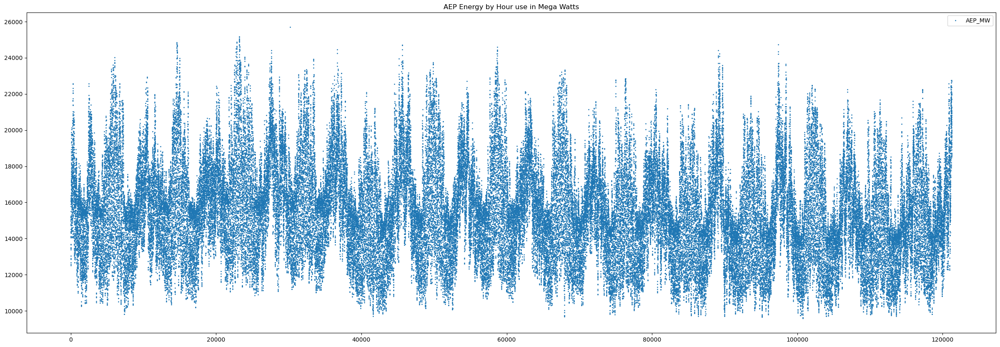

In [5]:
df.plot(y='AEP_MW', style='.', figsize=(30,10), color=color_pal[0], 
        title='AEP Energy by Hour use in Mega Watts', ms=2)
plt.show()

In [6]:
df_new = df.copy()
df_new = df.set_index('Datetime')
df_new.index = pd.to_datetime(df_new.index)
df_new['date'] = df_new.index
df_new['hour'] = df_new.index.hour
df_new['month'] = df_new.index.month
df_new['year'] = df_new.index.year
df_new['quarter'] = df_new.index.quarter

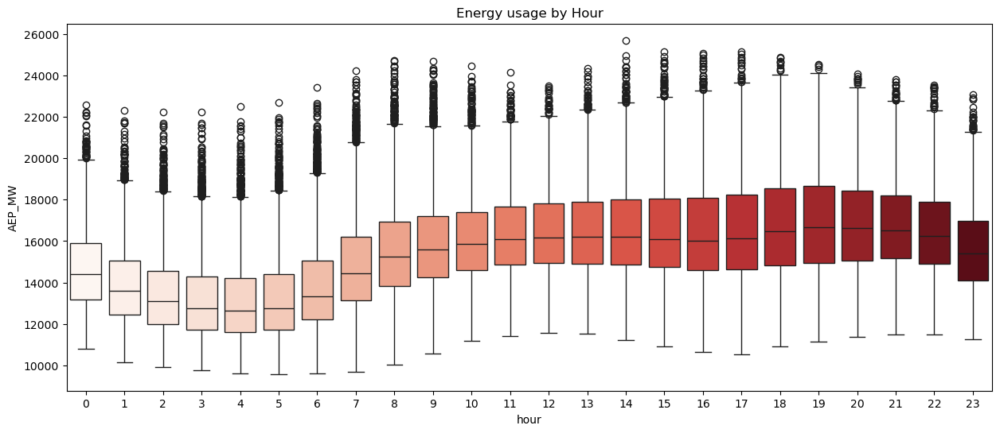

In [7]:
fig, ax = plt.subplots(figsize=(15, 6))
sns.boxplot(data=df_new, x='hour', y='AEP_MW',hue ='hour', palette = 'Reds',legend = False)
ax.set_title('Energy usage by Hour')
plt.show()

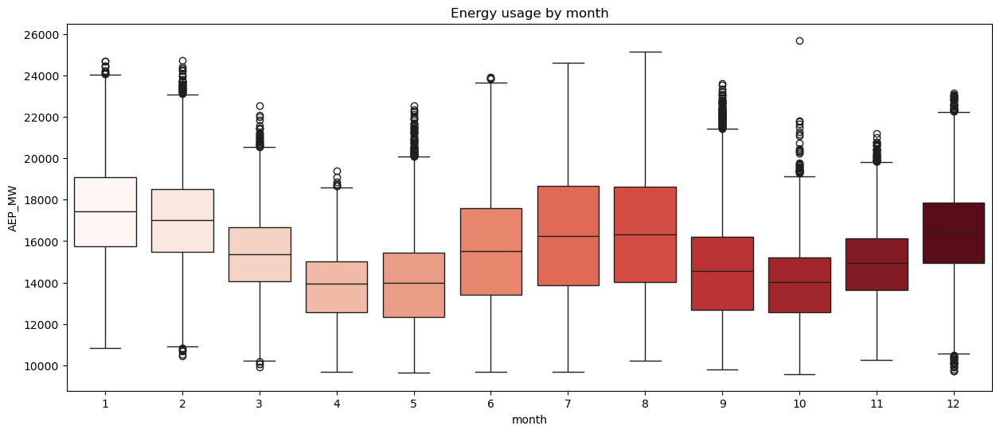

In [8]:
fig, ax = plt.subplots(figsize=(15, 6))
sns.boxplot(data = df_new, x = 'month', y = 'AEP_MW', hue = 'month', palette ='Reds',legend = False)
ax.set_title('Energy usage by month')
plt.show()

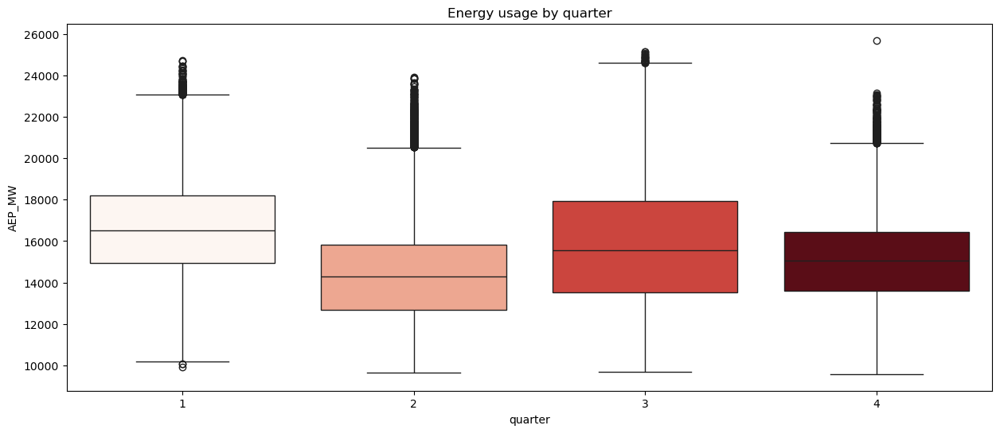

In [9]:
fig, ax = plt.subplots(figsize=(15, 6))
sns.boxplot(data=df_new, x='quarter', y='AEP_MW', hue ='quarter' ,palette='Reds',legend = False)
ax.set_title('Energy usage by quarter')
plt.show()

In [10]:
print(df.isnull().sum()) 

Datetime    0
AEP_MW      0
dtype: int64


In [11]:
df = df.sort_values(by='Datetime')

In [12]:
df.head()

,Datetime,AEP_MW
2183,2004-10-01 01:00:00,12379.0
2184,2004-10-01 02:00:00,11935.0
2185,2004-10-01 03:00:00,11692.0
2186,2004-10-01 04:00:00,11597.0
2187,2004-10-01 05:00:00,11681.0


In [17]:
train_size = int(len(df) * 0.7)
train, test = df[:train_size], df[train_size:]

In [18]:
print(train.shape)
print(test.shape)

(84891, 2)
(36382, 2)


In [19]:
x_train = train['AEP_MW'].values[:-1].reshape(-1, 1)  
y_train = train['AEP_MW'].values[1:].reshape(-1, 1) 
x_test = test['AEP_MW'].values[:-1].reshape(-1, 1)
y_test = test['AEP_MW'].values[1:].reshape(-1, 1)

In [20]:
scaler = MinMaxScaler()
x_train_scaled = scaler.fit_transform(x_train)
y_train_scaled = scaler.fit_transform(y_train)
x_test_scaled = scaler.transform(x_test)
y_test_scaled = scaler.transform(y_test)

In [21]:
reservoir = Reservoir(
    100,
    sr=0.9,
    rc_connectivity=0.08,
    input_scaling=0.9,
    seed=42
)
ridge = Ridge(ridge=1e-6)
esn_model = reservoir >> ridge

In [22]:
esn_model = esn_model.fit(x_train_scaled, y_train_scaled)

test_pred = esn_model.run(x_test_scaled)

Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 341it [00:00, 3384.07it/s]           
Running Model-0: 811it [00:00, 4138.72it/s]
Running Model-0: 1228it [00:00, 4146.34it/s]
Running Model-0: 1703it [00:00, 4381.97it/s]
Running Model-0: 2188it [00:00, 4538.40it/s]
Running Model-0: 2665it [00:00, 4605.48it/s]
Running Model-0: 3151it [00:00, 4676.71it/s]
Running Model-0: 3619it [00:00, 4496.79it/s]
Running Model-0: 4093it [00:00, 4560.43it/s]
Running Model-0: 4567it [00:01, 4604.59it/s]
Running Model-0: 5029it [00:01, 4339.65it/s]
Running Model-0: 5467it [00:01, 3997.88it/s]
Running Model-0: 5874it [00:01, 3725.17it/s]
Running Model-0: 6254it [00:01, 3698.13it/s]
Running Model-0: 6629it [00:01, 3315.56it/s]
Running Model-0: 6969it [00:01, 2688.78it/s]
Running Model-0: 7337it [00:01, 2912.09it/s]
Running Model-0: 7709it [00:02, 3106.11it/s]
Running Model-0: 8217it [00:02, 3612.67it/s]
Running Model-0: 8600it [00:02, 3654.38it/s]
Running Model-0: 8982it [00:02, 3699

Fitting node Ridge-0...


Running Model-0: 36381it [00:14, 2471.23it/s]         


In [24]:
test_pred_orig = scaler.inverse_transform(test_pred)
y_test_orig = scaler.inverse_transform(y_test_scaled)

In [25]:
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, test_pred))
mae_scaled = mean_absolute_error(y_test_scaled, test_pred)
r2_scaled = r2_score(y_test_scaled, test_pred)

print(f"Scaled Test RMSE: {rmse_scaled}")
print(f"Scaled Test MAE: {mae_scaled}")
print(f"Scaled Test R^2: {r2_scaled}")

Scaled Test RMSE: 0.014443004862413763
Scaled Test MAE: 0.010728367608010589
Scaled Test R^2: 0.9913666874005821


In [26]:
rmse = np.sqrt(mean_squared_error(y_test_orig, test_pred_orig))
mae = mean_absolute_error(y_test_orig, test_pred_orig)
r2 = r2_score(y_test_orig, test_pred_orig)

print(f"Test RMSE: {rmse}")
print(f"Test MAE: {mae}")
print(f"Test R^2: {r2}")

Test RMSE: 231.46359592504297
Test MAE: 171.9328192859777
Test R^2: 0.9913666874005821


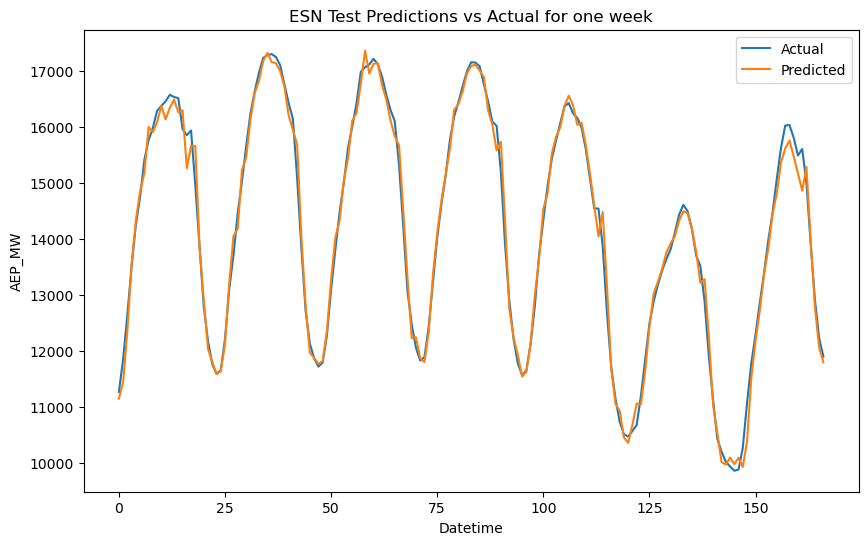

In [27]:
plt.figure(figsize = (10, 6))
plt.plot(y_test_orig[1:168], label = "Actual")
plt.plot(test_pred_orig[1:168], label = "Predicted")
plt.title("ESN Test Predictions vs Actual for one week")
plt.xlabel("Datetime")
plt.ylabel("AEP_MW")
plt.legend()
plt.show()

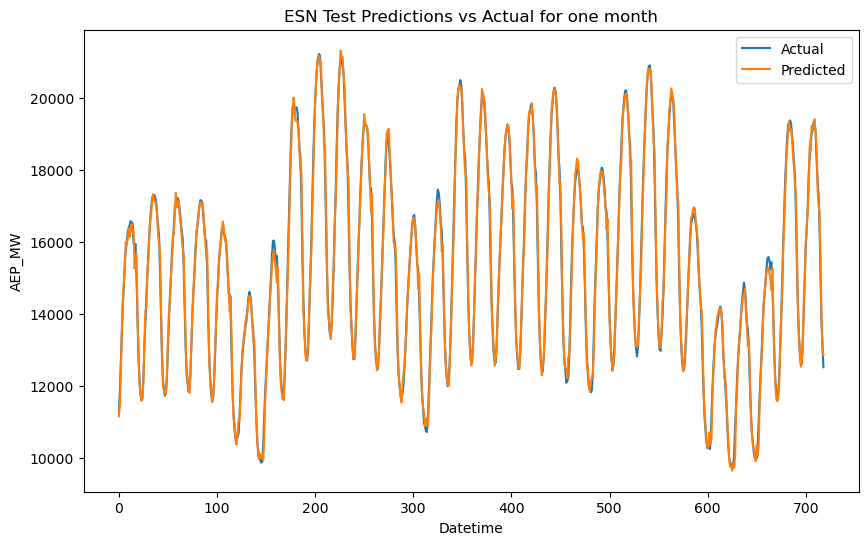

In [28]:
plt.figure(figsize = (10, 6))
plt.plot(y_test_orig[1:720] , label = "Actual")
plt.plot(test_pred_orig[1:720] , label = "Predicted")
plt.title("ESN Test Predictions vs Actual for one month")
plt.xlabel("Datetime")
plt.ylabel("AEP_MW")
plt.legend()
plt.show()

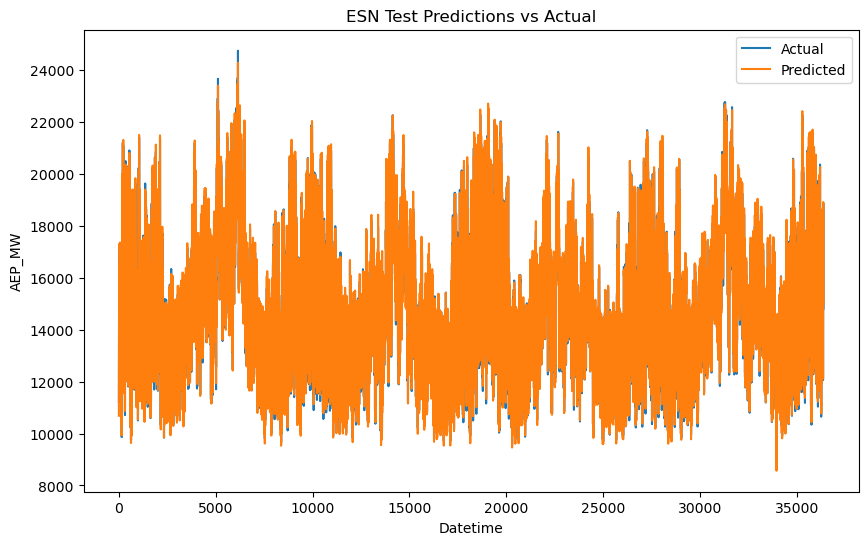

In [29]:
plt.figure(figsize = (10, 6))
plt.plot(y_test_orig, label = "Actual")
plt.plot(test_pred_orig, label = "Predicted")
plt.title("ESN Test Predictions vs Actual")
plt.xlabel("Datetime")
plt.ylabel("AEP_MW")
plt.legend()
plt.show()

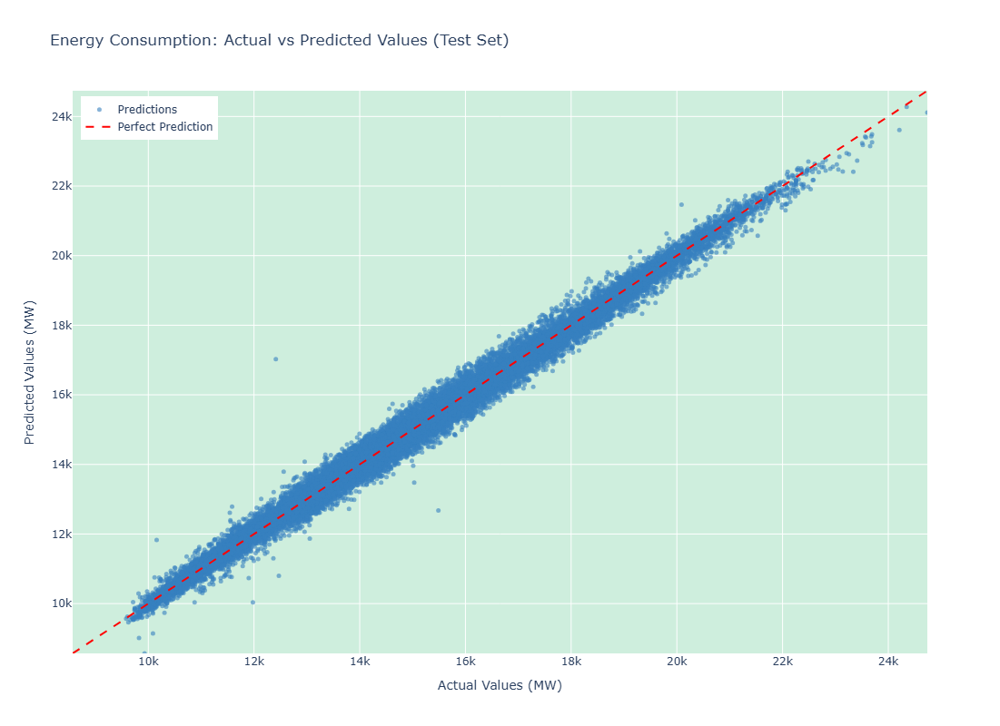

In [30]:
fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=y_test_orig.flatten(),
        y=test_pred_orig.flatten(),
        mode='markers',
        name='Predictions',
        marker=dict(
            size=5,
            color='rgba(55, 128, 191, 0.6)',
            line=dict(width=0)
        ),
        hovertemplate='Actual: %{x:.0f}<br>Predicted: %{y:.0f}<extra></extra>'
    )
)
min_val = min(y_test_orig.min(), test_pred_orig.min())
max_val = max(y_test_orig.max(), test_pred_orig.max())
fig.add_trace(
    go.Scatter(
        x=[min_val, max_val],
        y=[min_val, max_val],
        mode='lines',
        name='Perfect Prediction',
        line=dict(color='red', dash='dash'),
    )
)
fig.update_layout(
    title='Energy Consumption: Actual vs Predicted Values (Test Set)',
    xaxis_title='Actual Values (MW)',
    yaxis_title='Predicted Values (MW)',
    width=1000,
    height=800,
    showlegend=True,
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    ),
    shapes=[
        dict(
            type="rect",
            xref="x",
            yref="y",
            x0=min_val,
            y0=min_val * 0.95,
            x1=max_val,
            y1=max_val * 1.05,
            fillcolor="rgba(0,255,0,0.1)",
            line_width=0,
            layer="below"
        )
    ]
)
fig.update_xaxes(range=[min_val, max_val])
fig.update_yaxes(range=[min_val, max_val])

fig.update_layout(
    dragmode='zoom',
    hovermode='closest'
)
fig.show()

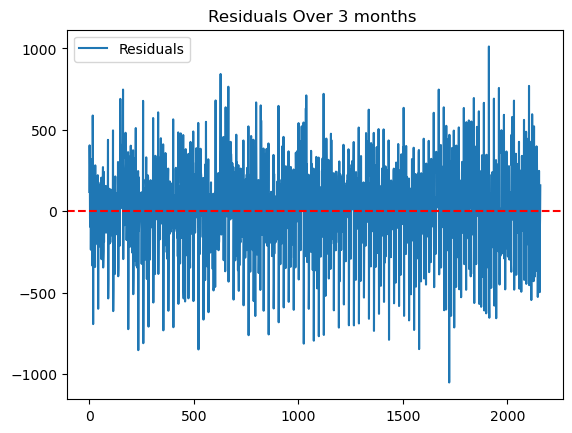

In [31]:
residuals = y_test_orig - test_pred_orig
plt.plot(residuals[1:2160], label = "Residuals")
plt.axhline(y = 0, color = 'r', linestyle = '--')
plt.title("Residuals Over 3 months ")
plt.legend()
plt.show()

In [32]:
#lstm model

In [33]:
data = df['AEP_MW'].values.reshape(-1, 1)  

In [34]:
data_scaled = scaler.fit_transform(data)

In [35]:
train_size = int(len(data_scaled) * 0.8)  
validation_size = int(len(data_scaled) * 0.10)   
test_size = len(data_scaled) - train_size - validation_size  

In [36]:
train_set = data_scaled[: train_size]
validation_set = data_scaled[train_size : train_size + validation_size]
test_set = data_scaled[train_size + validation_size :]

In [37]:
def create_sequences(data, look_back):
    x, y = [], []
    for i in range(len(data) - look_back):
        x.append(data[i:i + look_back])
        y.append(data[i + look_back])
    return np.array(x), np.array(y)

In [38]:
look_back = 24
x_train, y_train = create_sequences(train_set , look_back)
x_val, y_val = create_sequences(validation_set , look_back)
x_test, y_test = create_sequences(test_set , look_back)

In [39]:
print("Shape of x_train:", x_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of x_val:", x_val.shape)
print("Shape of y_val:", y_val.shape)
print("Shape of x_test:", x_test.shape)
print("Shape of y_test:", y_test.shape)

Shape of x_train: (96994, 24, 1)
Shape of y_train: (96994, 1)
Shape of x_val: (12103, 24, 1)
Shape of y_val: (12103, 1)
Shape of x_test: (12104, 24, 1)
Shape of y_test: (12104, 1)


In [40]:
LSTM_model = Sequential([
    Input(shape = (x_train.shape[1], x_train.shape[2])),
    LSTM(50, activation = "tanh", return_sequences = True),
    Dropout(0.2),
    LSTM(50, activation = "tanh"),
    Dropout(0.2),
    Dense(1)
])

LSTM_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
LSTM_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 24, 50)         │        10,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 24, 50)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 30,651 (119.73 KB)

 Trainable params: 30,651 (119.73 KB)

 Non-trainable params: 0 (0.00 B)

In [41]:
history = LSTM_model.fit(
    x_train, y_train,
    epochs = 20,
    batch_size = 32,
    validation_data = (x_val, y_val),
    verbose = 1)

Epoch 1/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 44s 13ms/step - loss: 0.0075 - val_loss: 4.2872e-04
Epoch 2/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 8.7850e-04 - val_loss: 3.6813e-04
Epoch 3/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 39s 13ms/step - loss: 6.1559e-04 - val_loss: 2.4866e-04
Epoch 4/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 5.6095e-04 - val_loss: 2.7105e-04
Epoch 5/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 39s 13ms/step - loss: 5.3975e-04 - val_loss: 3.5947e-04
Epoch 6/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 43s 14ms/step - loss: 5.0323e-04 - val_loss: 2.2964e-04
Epoch 7/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 54s 18ms/step - loss: 4.8133e-04 - val_loss: 2.3261e-04
Epoch 8/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 55s 18ms/step - loss: 4.7151e-04 - val_loss: 2.0727e-04
Epoch 9/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 54s 18ms/step - loss: 4.5608e-04 - val_loss: 2.0804e-04
Epoch 10/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 54s 18ms/step - loss: 4.4320e-04 - val_loss: 2.0711e-04
Epoch 11/20
3032/3032 ━

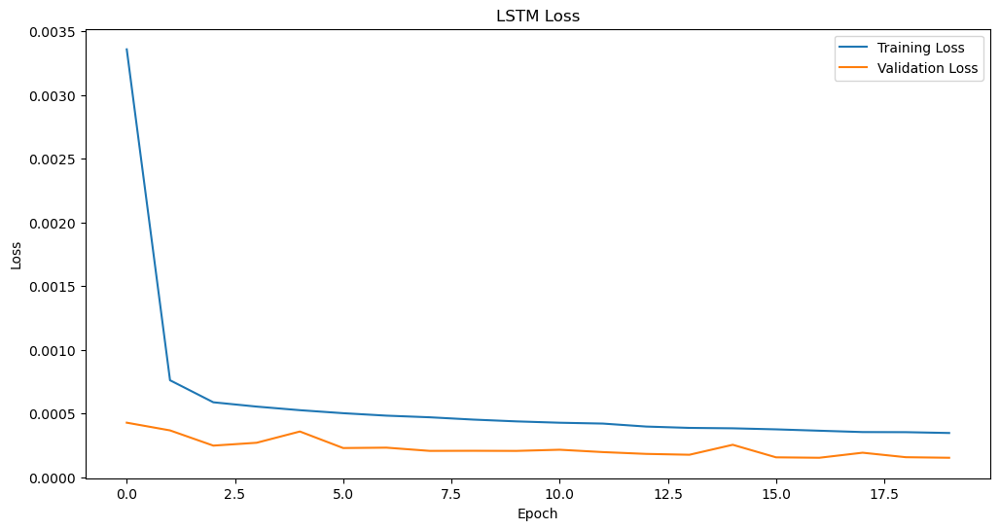

In [42]:
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [46]:
LSTM_pred = LSTM_model.predict(x_test)

LSTM_pred_original = scaler.inverse_transform(LSTM_pred)
y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1))

379/379 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step


In [47]:
lstm_rmse = np.sqrt(mean_squared_error(y_test_original, LSTM_pred_original))
lstm_mae = mean_absolute_error(y_test_original, LSTM_pred_original)
lstm_r2 = r2_score(y_test_original, LSTM_pred_original)

print(f"Test LSTM RMSE: {lstm_rmse}")
print(f"Test LSTM MAE: {lstm_mae}")
print(f"Test LSTM R^2: {lstm_r2}")

Test LSTM RMSE: 178.87416002070714
Test LSTM MAE: 131.93691119025735
Test LSTM R^2: 0.9946996277242551


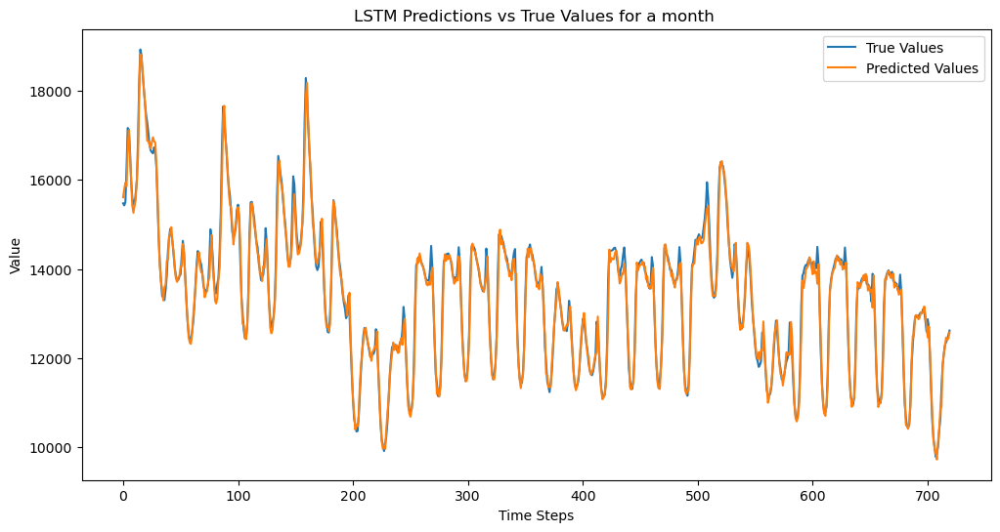

In [48]:
plt.figure(figsize = (12, 6))
plt.plot(y_test_original[:720], label = "True Values")
plt.plot(LSTM_pred_original[:720], label = "Predicted Values")
plt.title("LSTM Predictions vs True Values for a month ")
plt.xlabel("Time Steps")
plt.ylabel("Value")
plt.legend()
plt.show()

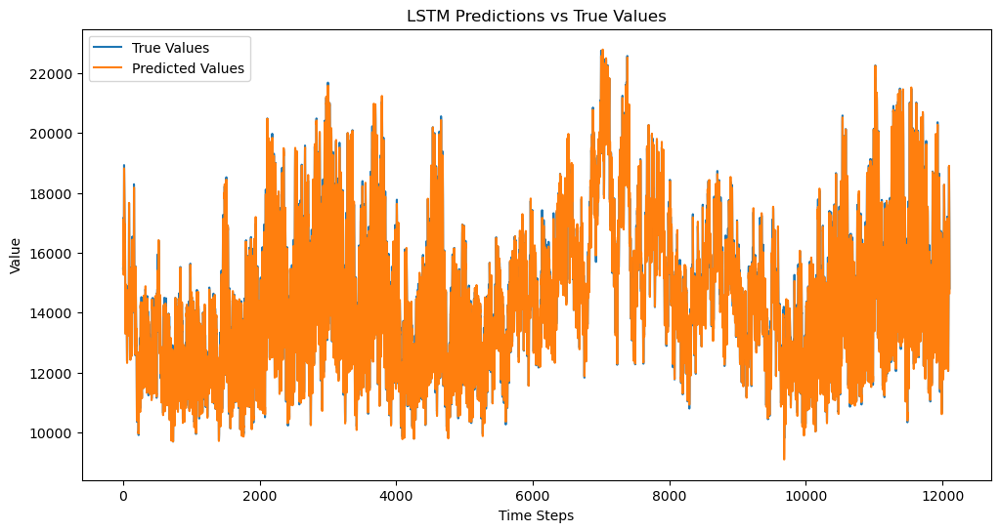

In [49]:
plt.figure(figsize = (12, 6))
plt.plot(y_test_original, label = "True Values")
plt.plot(LSTM_pred_original, label = "Predicted Values")
plt.title("LSTM Predictions vs True Values")
plt.xlabel("Time Steps")
plt.ylabel("Value")
plt.legend()
plt.show()

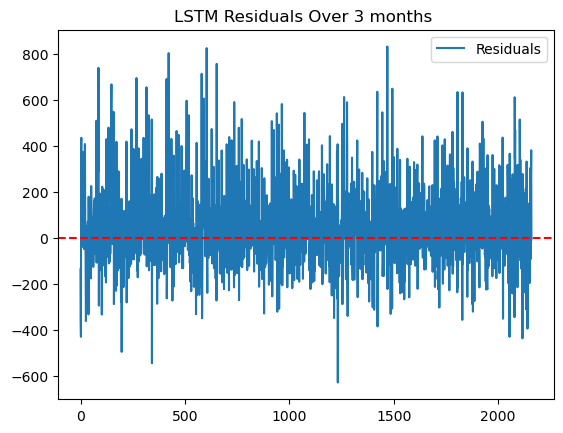

In [66]:
lstm_residuals = y_test_original - LSTM_pred_original
plt.plot(residuals[:2160], label = "Residuals")
plt.axhline(y = 0, color = 'r', linestyle = '--')
plt.title("LSTM Residuals Over 3 months ")
plt.legend()
plt.show()

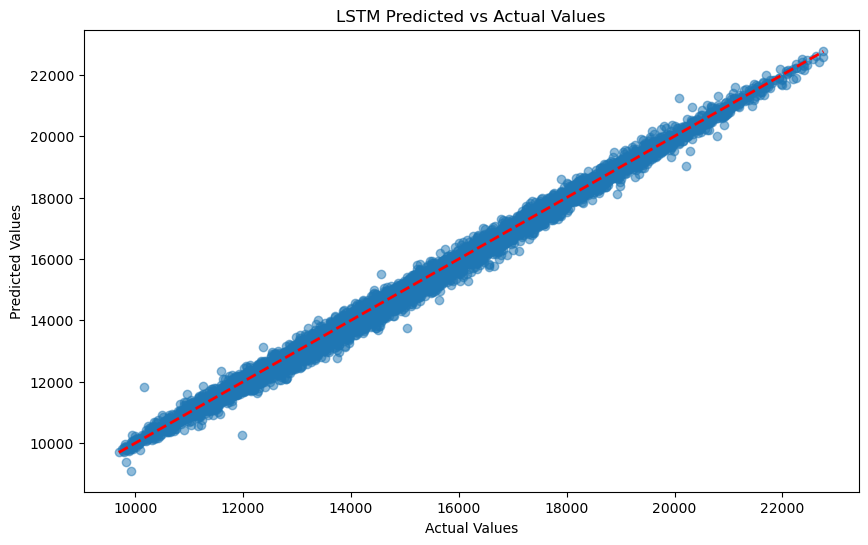

In [69]:
plt.figure(figsize = (10, 6))
plt.scatter(y_test_original, LSTM_pred_original, alpha = 0.5)
plt.plot([y_test_original.min(), y_test_original.max()], 
         [y_test_original.min(), y_test_original.max()], 
         'r--', lw = 2)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('LSTM Predicted vs Actual Values')
plt.show()

In [70]:
#bi lstm model

In [51]:
bi_lstm_model = Sequential([
    Input(shape = (x_train.shape[1] , x_train.shape[2])) ,
    Bidirectional(LSTM(50,activation = 'tanh', return_sequences = True)) ,
    Dropout(0.2),
    Bidirectional(LSTM(50,activation = 'tanh', return_sequences = True)) ,
    Dropout(0.2),
    Dense(1)
])

In [52]:
bi_lstm_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
bi_lstm_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional (Bidirectional)   │ (None, 24, 100)        │        20,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 24, 100)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 24, 100)        │        60,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 24, 100)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 24, 1)          │           101 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 81,301 (317.58 KB)

 Trainable params: 81,301 (317.58 KB)

 Non-trainable params: 0 (0.00 B)

In [53]:
bi_lstm_history = bi_lstm_model.fit(
    x_train, y_train,
    epochs = 20,
    batch_size = 32,
    validation_data = (x_val, y_val),
    verbose = 1)

Epoch 1/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 88s 25ms/step - loss: 0.0075 - val_loss: 9.8335e-04
Epoch 2/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 92s 29ms/step - loss: 0.0014 - val_loss: 6.7430e-04
Epoch 3/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 84s 28ms/step - loss: 7.7200e-04 - val_loss: 3.4852e-04
Epoch 4/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 167s 36ms/step - loss: 5.2875e-04 - val_loss: 9.7695e-04
Epoch 5/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 108s 36ms/step - loss: 4.8010e-04 - val_loss: 9.1450e-04
Epoch 6/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 110s 36ms/step - loss: 5.5253e-04 - val_loss: 2.0145e-04
Epoch 7/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 102s 34ms/step - loss: 4.2080e-04 - val_loss: 3.2129e-04
Epoch 8/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 90s 30ms/step - loss: 4.0582e-04 - val_loss: 2.8717e-04
Epoch 9/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 75s 25ms/step - loss: 3.9542e-04 - val_loss: 2.6182e-04
Epoch 10/20
3032/3032 ━━━━━━━━━━━━━━━━━━━━ 61s 20ms/step - loss: 3.4726e-04 - val_loss: 2.5362e-04
Epoch 11/20
3032/3032 ━

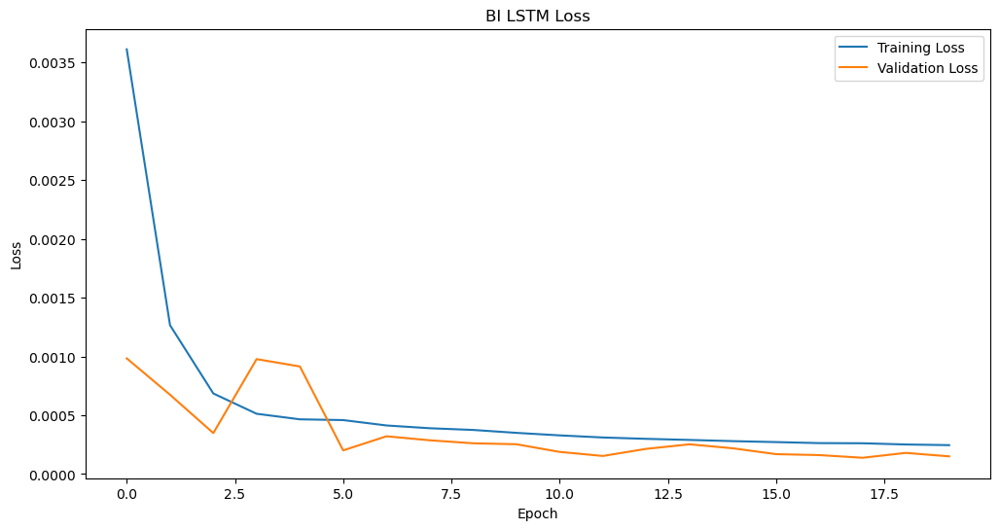

In [54]:
plt.figure(figsize = (12 , 6))
plt.plot(bi_lstm_history.history['loss'] , label = 'Training Loss')
plt.plot(bi_lstm_history.history['val_loss'] , label = 'Validation Loss')
plt.title('BI LSTM Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [55]:
BI_LSTM_pred = bi_lstm_model.predict(x_test)

379/379 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step


In [60]:
BI_LSTM_pred_reduced = tf.reduce_mean(BI_LSTM_pred , axis = 1)  

In [61]:
BI_LSTM_pred_rescaled = scaler.inverse_transform(BI_LSTM_pred_reduced)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1 , 1))

In [62]:
bi_lstm_rmse = np.sqrt(mean_squared_error(y_test_rescaled, BI_LSTM_pred_rescaled))
bi_lstm_mae = mean_absolute_error(y_test_rescaled, BI_LSTM_pred_rescaled)
bi_lstm_r2 = r2_score(y_test_rescaled, BI_LSTM_pred_rescaled)

print(f"Test BI_LSTM RMSE: {bi_lstm_rmse}")
print(f"Test BI_LSTM MAE: {bi_lstm_mae}")
print(f"Test BI_LSTM R^2: {bi_lstm_r2}")

Test BI_LSTM RMSE: 184.78396648819484
Test BI_LSTM MAE: 139.75436607406223
Test BI_LSTM R^2: 0.9943436050033698


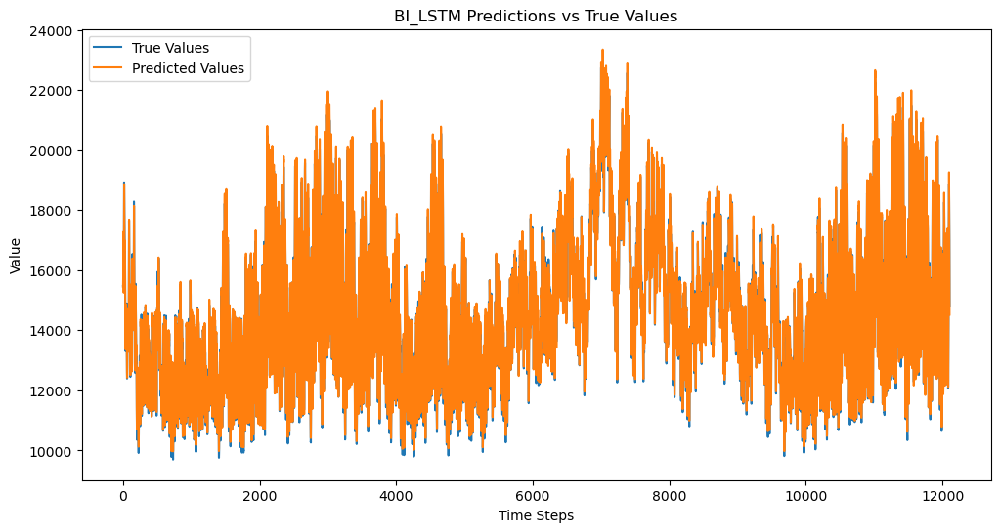

In [63]:
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label = "True Values")
plt.plot(BI_LSTM_pred_rescaled, label = "Predicted Values")
plt.title("BI_LSTM Predictions vs True Values")
plt.xlabel("Time Steps")
plt.ylabel("Value")
plt.legend()
plt.show()

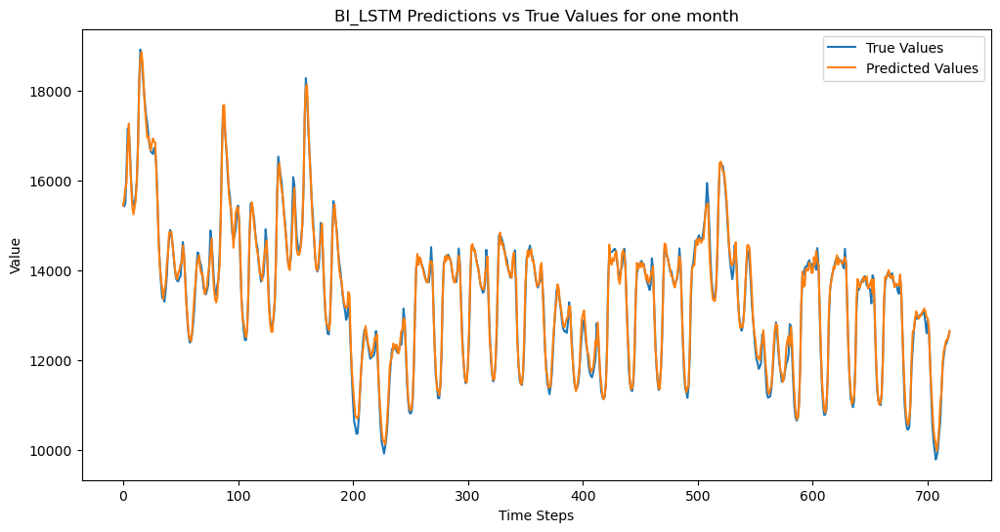

In [64]:
plt.figure(figsize = (12, 6))
plt.plot(y_test_rescaled[:720] , label = "True Values")
plt.plot(BI_LSTM_pred_rescaled[:720] , label = "Predicted Values")
plt.title("BI_LSTM Predictions vs True Values for one month")
plt.xlabel("Time Steps")
plt.ylabel("Value")
plt.legend()
plt.show()

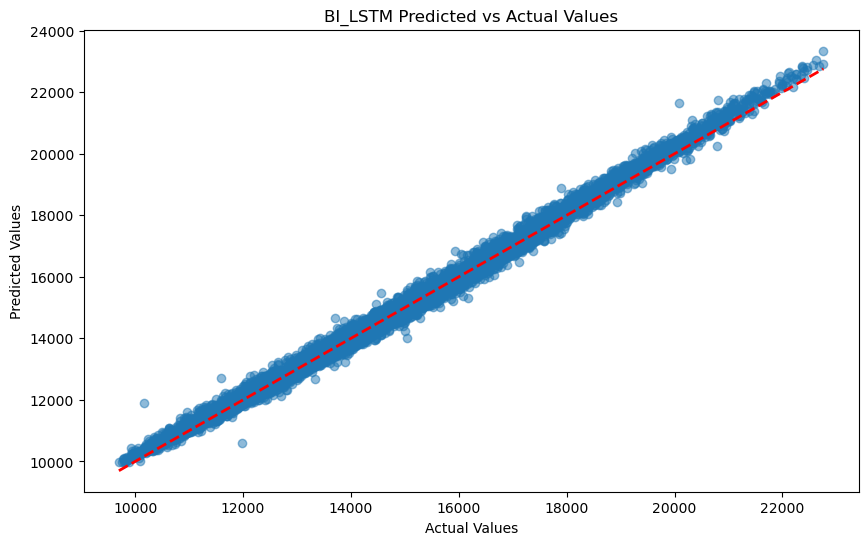

In [68]:
plt.figure(figsize = (10, 6))
plt.scatter(y_test_rescaled, BI_LSTM_pred_rescaled, alpha = 0.5)
plt.plot([y_test_rescaled.min(), y_test_rescaled.max()], 
         [y_test_rescaled.min(), y_test_rescaled.max()], 
         'r--', lw = 2)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('BI_LSTM Predicted vs Actual Values')
plt.show()

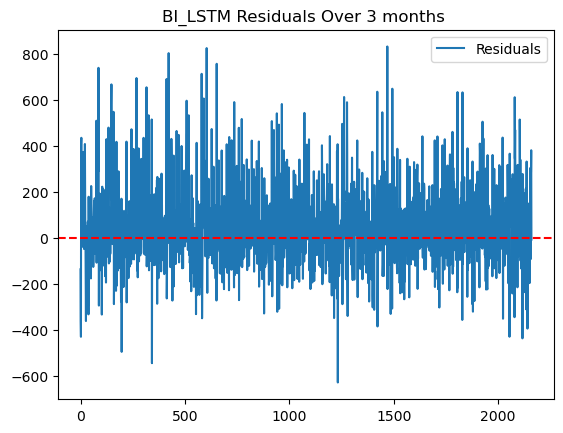

In [67]:
Bi_lstm_residuals = y_test_rescaled - BI_LSTM_pred_rescaled
plt.plot(residuals[:2160], label = "Residuals")
plt.axhline(y = 0, color = 'r', linestyle = '--')
plt.title("BI_LSTM Residuals Over 3 months ")
plt.legend()
plt.show()